In [4]:
import os
import librosa
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
import librosa as lr
import librosa.display
from glob import glob

# Set directory where audio files are located
audio_dir = r'small'

# Set directory where to save the melspectrograms
save_dir = r'C:\Users\SHANMUKH\NOTEBOOK\Spectogram\Images(Spectograms)'

audio_files=glob(audio_dir + '/*.wav')
audio_files


['small\\15001_20210816__pos_mild_counting-fast.wav',
 'small\\15002_20210816__pos_mild_counting-normal.wav',
 'small\\15003_20210816__pos_mild_vowel-a.wav',
 'small\\15004_20210816__pos_mild_vowel-e.wav',
 'small\\15005_20210816__pos_mild_vowel-o.wav',
 'small\\15006_20210816__he_breathing-deep.wav',
 'small\\15007_20210816__he_breathing-shallow.wav',
 'small\\15008_20210816__he_cough-heavy.wav',
 'small\\15009_20210816__he_cough-shallow.wav',
 'small\\15010_20210816__he_counting-fast.wav',
 'small\\15011_20210816__he_counting-normal.wav',
 'small\\15012_20210816__he_vowel-a.wav',
 'small\\15013_20210816__he_vowel-e.wav',
 'small\\15014_20210816__he_vowel-o.wav',
 'small\\15015_20210816__pos_mild_breathing-deep.wav',
 'small\\15016_20210816__pos_mild_breathing-shallow.wav',
 'small\\15017_20210816__pos_mild_cough-heavy.wav',
 'small\\15018_20210816__pos_mild_cough-shallow.wav',
 'small\\15019_20210816__pos_mild_counting-fast.wav',
 'small\\15020_20210816__pos_mild_counting-normal.wav'

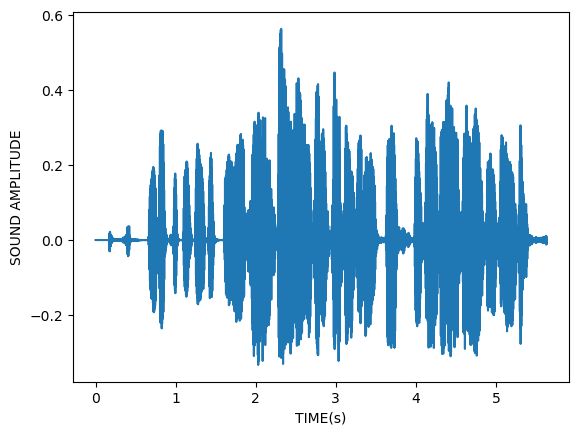

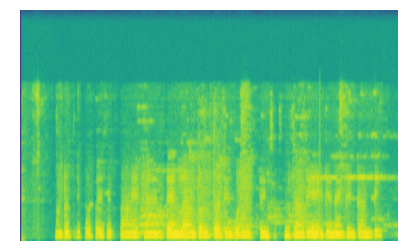

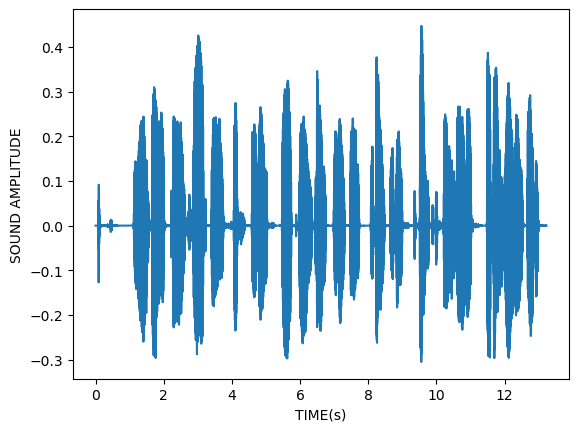

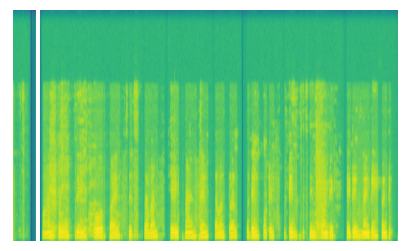

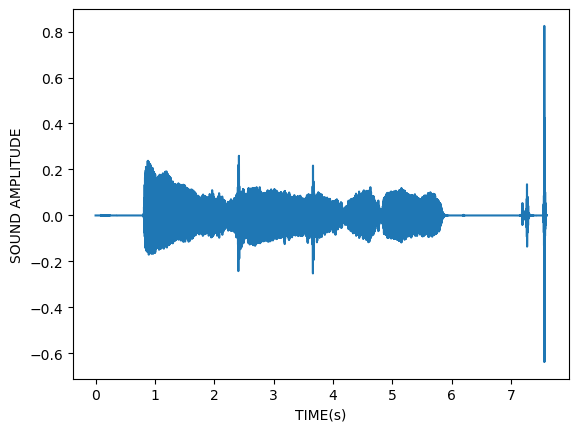

...

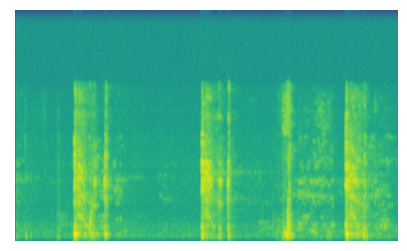

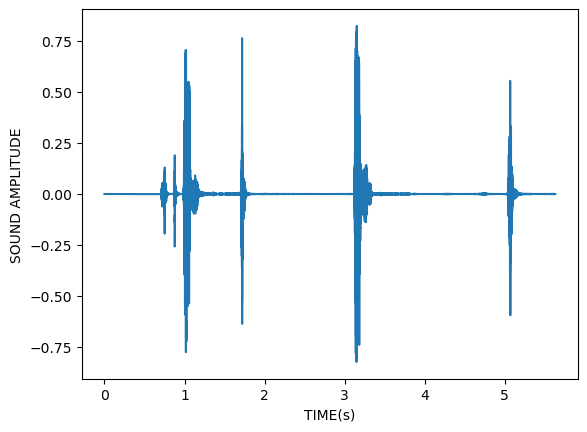

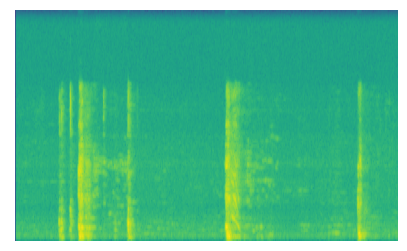

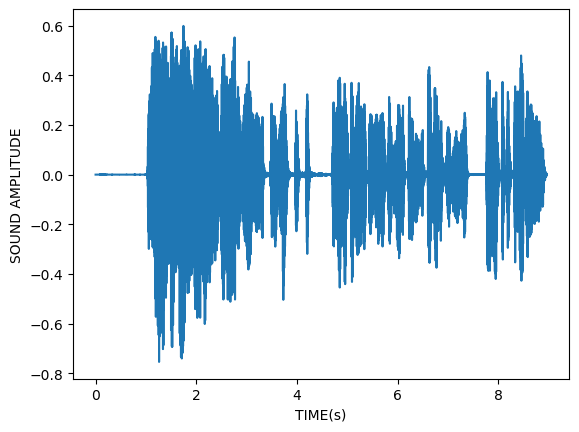

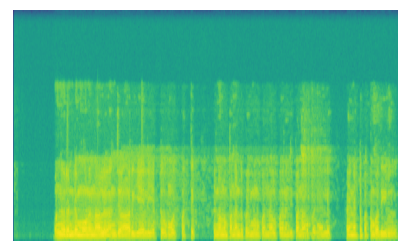

In [5]:
for file in range(0,len(audio_files), 1):
    audio,sfreq=lr.load(audio_files[file])
    time=np.arange(0,len(audio)) / sfreq
    fig,ax=plt.subplots()
    ax.plot(time,audio)
    ax.set(xlabel='TIME(s)',ylabel='SOUND AMPLITUDE')
    plt.show()
    fig, ax = plt.subplots(figsize=(5, 3))
    ax.set_axis_off()
    ax.specgram(audio, Fs=2)
    #fig.savefig('Images(Spectograms)'.format(file), bbox_inches='tight',pad_inches=0)
    image = fig.savefig(f"{save_dir}/fig[{file}].png")

In [16]:
import glob

import os
def classify_file(dir):
    labels = {}
    for file in os.listdir(dir):
        if "he" in file:
            labels[file] = "0"
        elif "pos" in file:
            labels[file] = "1"
        else:
            labels[file] = "Other"

    return labels

In [17]:
labels=classify_file(r'small')
print(labels)

{'15001_20210816__pos_mild_counting-fast.wav': '1', '15002_20210816__pos_mild_counting-normal.wav': '1', '15003_20210816__pos_mild_vowel-a.wav': '1', '15004_20210816__pos_mild_vowel-e.wav': '1', '15005_20210816__pos_mild_vowel-o.wav': '1', '15006_20210816__he_breathing-deep.wav': '0', '15007_20210816__he_breathing-shallow.wav': '0', '15008_20210816__he_cough-heavy.wav': '0', '15009_20210816__he_cough-shallow.wav': '0', '15010_20210816__he_counting-fast.wav': '0', '15011_20210816__he_counting-normal.wav': '0', '15012_20210816__he_vowel-a.wav': '0', '15013_20210816__he_vowel-e.wav': '0', '15014_20210816__he_vowel-o.wav': '0', '15015_20210816__pos_mild_breathing-deep.wav': '1', '15016_20210816__pos_mild_breathing-shallow.wav': '1', '15017_20210816__pos_mild_cough-heavy.wav': '0', '15018_20210816__pos_mild_cough-shallow.wav': '1', '15019_20210816__pos_mild_counting-fast.wav': '1', '15020_20210816__pos_mild_counting-normal.wav': '1', '15021_20210816__pos_mild_vowel-a.wav': '1', '15022_20210

In [24]:
x=[]
for file in os.listdir(r'small'):
    x.append(labels[file])


['1', '1', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '1', '1', '0', '1', '1', '1', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '1', '1']


In [30]:
import os
import librosa
import numpy as np
import pandas as pd
from PIL import Image

# Set the directory containing the spectrograms
spec_dir = r'C:\Users\SHANMUKH\NOTEBOOK\Spectogram\Images(Spectograms)'

# Get a list of the spectrogram file paths
spec_files = [os.path.join(spec_dir, f) for f in os.listdir(spec_dir) if f.endswith(".png")]




# Define a function to extract features from a spectrogram
def extract_features(spec_path,i):
    # Load the image and convert to a numpy array
    img = Image.open(spec_path).convert('L')
    img_arr = np.array(img)

    # Convert to a mel-spectrogram
    #melspec = librosa.feature.melspectrogram(y=img_arr, sr=22050, n_fft=2048, hop_length=512)



    # Calculate spectral rolloff
    rolloff = librosa.feature.spectral_rolloff(S=img_arr)
    
    # Concatenate all features into a single array
    return rolloff.mean(),x[i]

# Extract features for all spectrograms
features_list = []
i=0
for spec_file in spec_files:
    features = extract_features(spec_file,i)
    i+=1
    features_list.append(features)

# Convert features list to a pandas DataFrame
df = pd.DataFrame(features_list)

# Save DataFrame to a CSV file
df.to_csv("spectrogram_features.csv", index=False)
